In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import matplotlib.image as mpimg

In [ ]:
def plot4GrayImages(img1, img2, img3, img4, titleImg1 = "", titleImg2 = "", titleImg3 = "", titleImg4 = ""):
    plt.subplots(figsize=(24, 14))
    plt.subplot(141), plt.imshow(img1, cmap='gray'),plt.title(titleImg1)

    plt.subplot(142), plt.imshow(img2, cmap='gray'),plt.title(titleImg2)

    plt.subplot(143), plt.imshow(img3, cmap='gray'),plt.title(titleImg3)

    plt.subplot(144), plt.imshow(img4, cmap='gray'),plt.title(titleImg4)

    plt.show()

def plot3GrayImages(img1, img2, img3, titleImg1 = "", titleImg2 = "", titleImg3 = ""):
    plt.subplots(figsize=(24, 14))
    plt.subplot(131), plt.imshow(img1, cmap='gray'),plt.title(titleImg1)
    #plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(img2, cmap='gray'),plt.title(titleImg2)
    #plt.xticks([]), plt.yticks([])
    plt.subplot(133), plt.imshow(img3, cmap='gray'),plt.title(titleImg3)
    #plt.xticks([]), plt.yticks([])
    plt.show()

def plot3Images(img1, img2, img3, titleImg1 = "", titleImg2 = "", titleImg3 = ""):
    plt.subplots(figsize=(24, 14))
    plt.subplot(131), plt.imshow(img1),plt.title(titleImg1)
    #plt.xticks([]), plt.yticks([])
    plt.subplot(132), plt.imshow(img2),plt.title(titleImg2)
    #plt.xticks([]), plt.yticks([])
    plt.subplot(133), plt.imshow(img3),plt.title(titleImg3)
    #plt.xticks([]), plt.yticks([])
    plt.show()

###Q1. Carregar 'baboon.png' e mostrar cada canal separadamente em escala de cinza.

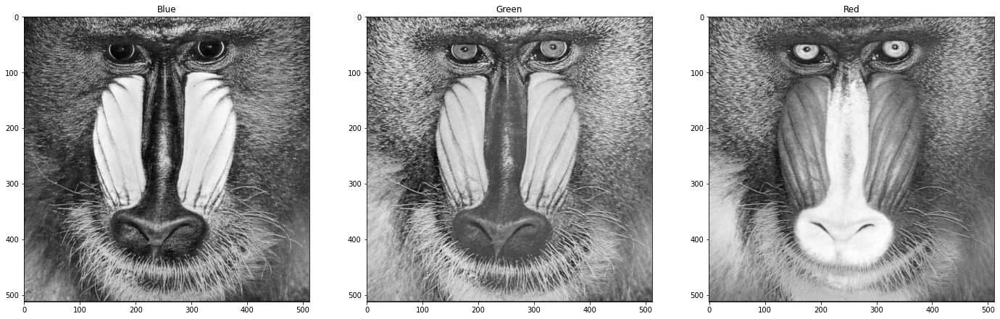

In [ ]:
img = cv.imread('baboon.png')
imgB = img[:, :, 0]
imgG = img[:, :, 1]
imgR = img[:, :, 2]
#print(img.shape, imgB.shape)
#print(imgB[0, 0])
#print(imgG[0, 0])
#print(imgR[0, 0])
#print(img)
plot3GrayImages(imgB, imgG, imgR, titleImg1 = "Blue", titleImg2 = "Green", titleImg3 = "Red")

###Q2. Fazer o mesmo p/ 'rgb.png'

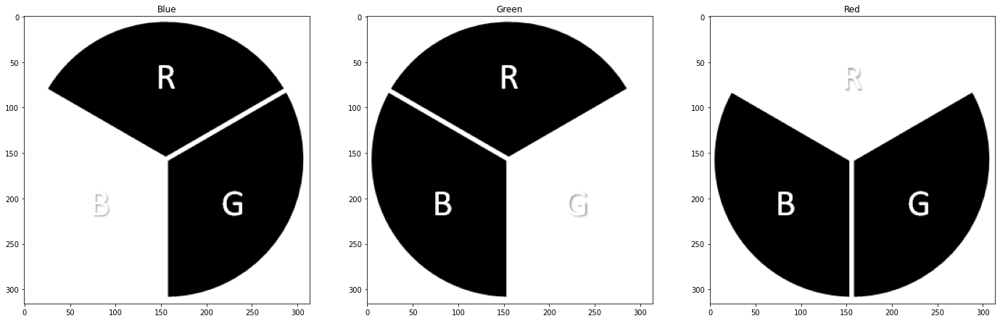

In [ ]:
img = cv.imread('rgb.png')
imgB = img[:, :, 0]
imgG = img[:, :, 1]
imgR = img[:, :, 2]
plot3GrayImages(imgB, imgG, imgR, titleImg1 = "Blue", titleImg2 = "Green", titleImg3 = "Red")

###Q3. Fazer o mesmo p/ 'rgbcube_kbkg'.

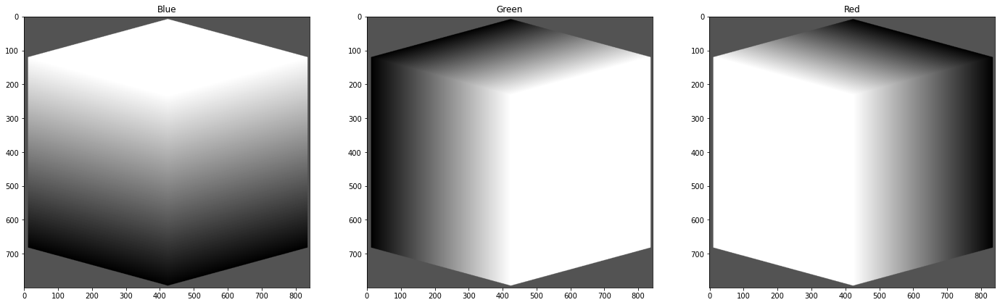

In [ ]:
img = cv.imread('rgbcube_kBKG.png')
imgB = img[:, :, 0]
imgG = img[:, :, 1]
imgR = img[:, :, 2]
plot3GrayImages(imgB, imgG, imgR, titleImg1 = "Blue", titleImg2 = "Green", titleImg3 = "Red")

###Q4. Repetir Q1, Q2 e Q3 convertendo as imagens para os seguintes espaços de cor:
- NTSC.
- HSV.
- HSI.
- LAB.
- CIE XYZ.
- CMYK.

In [ ]:
def plot3ColorsImagesGrayScale(img, title1='', title2='', title3=''):
    imgB = img[:, :, 0]
    imgG = img[:, :, 1]
    imgR = img[:, :, 2]
    plot3GrayImages(imgB, imgG, imgR, titleImg1 = title1, titleImg2 = title2, titleImg3 = title3)

def plot4ColorsImagesGrayScale(img, title1='', title2='', title3='', title4=''):
    imgC = img[:, :, 0]
    imgM = img[:, :, 1]
    imgY = img[:, :, 2]
    imgK = img[:, :, 3]
    plot4GrayImages(imgC, imgM, imgY, imgK, titleImg1 = title1, titleImg2 = title2, titleImg3 = title3, titleImg4 = title4)

- NTSC.

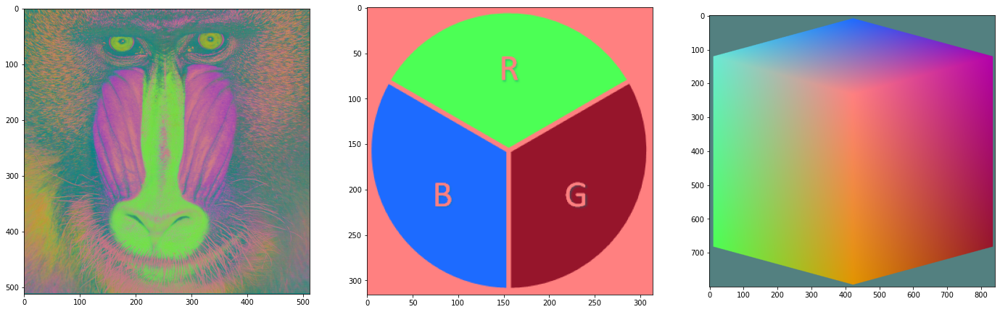

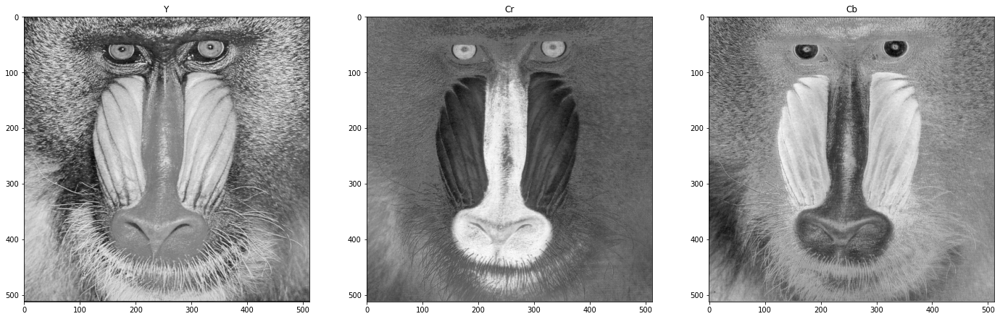

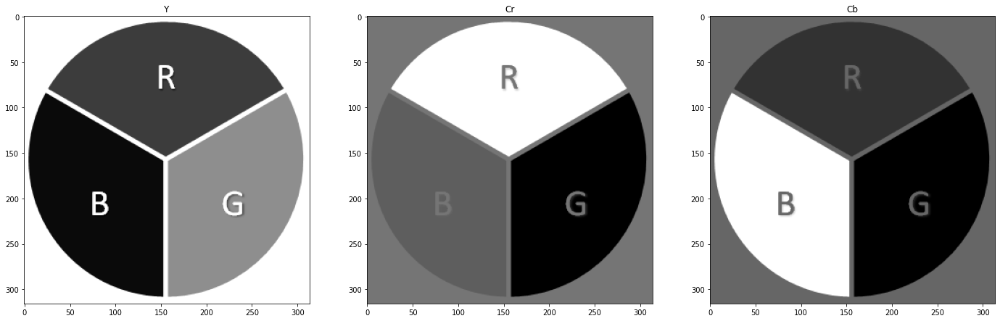

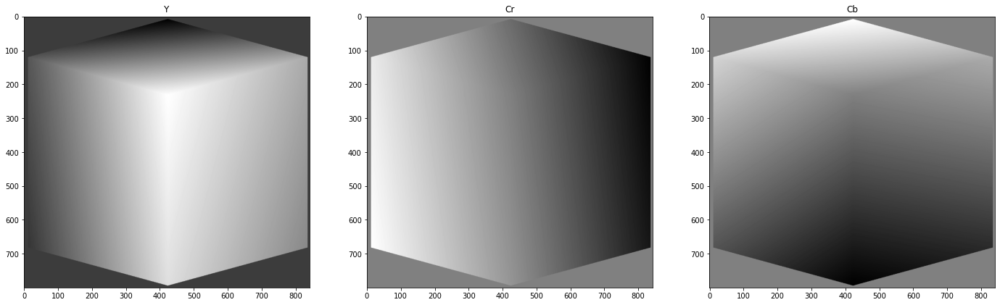

In [ ]:
images = []
images.append(cv.imread('baboon.png'))
images.append(cv.imread('rgb.png'))
images.append(cv.imread('rgbcube_kBKG.png'))

imagesNew = []

# Tranformando o espaco das cores
for img in images:
  imagesNew.append(cv.cvtColor(img, cv.COLOR_BGR2YCrCb))

# Plotando imagens apos tranformacao
plot3Images(imagesNew[0], imagesNew[1], imagesNew[2])

# Plotando 3 cores conforme as questoes Q1, Q2 e Q3
for img in imagesNew:
  plot3ColorsImagesGrayScale(img, title1='Y', title2='Cr', title3='Cb')

- HSV.

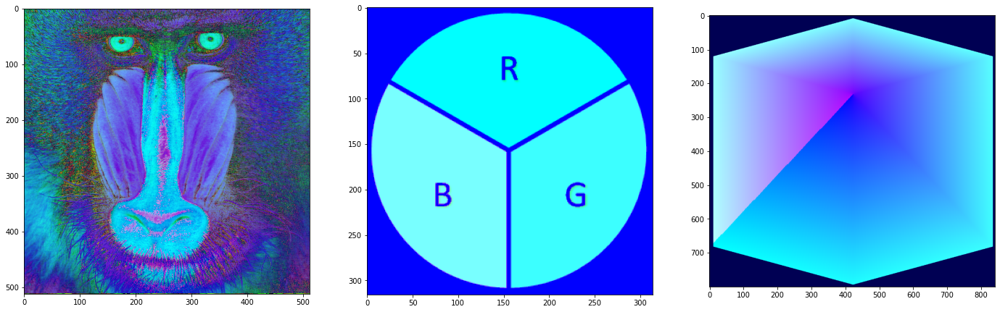

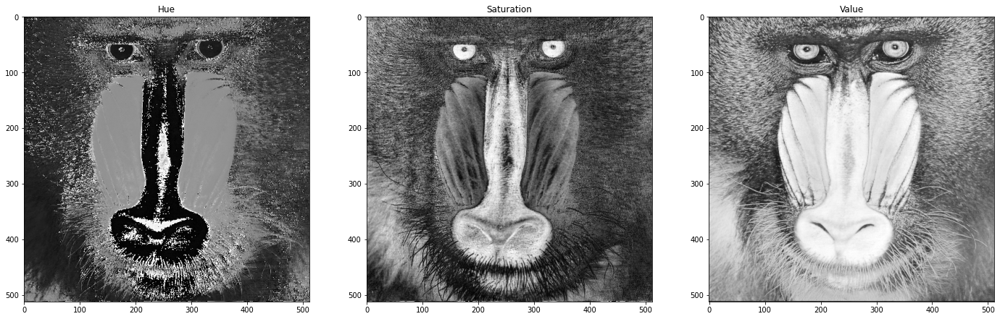

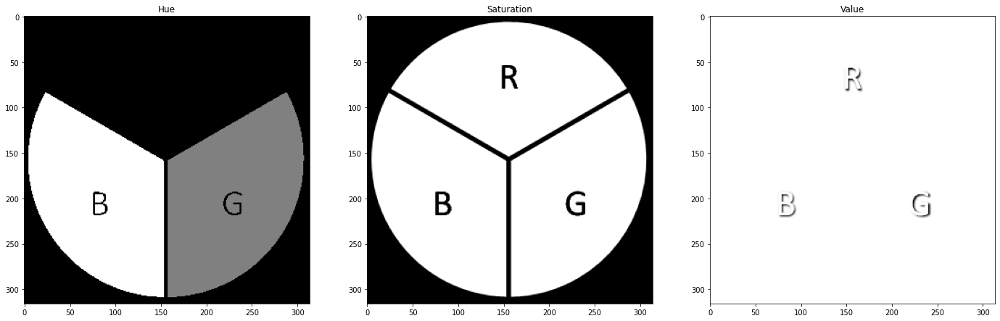

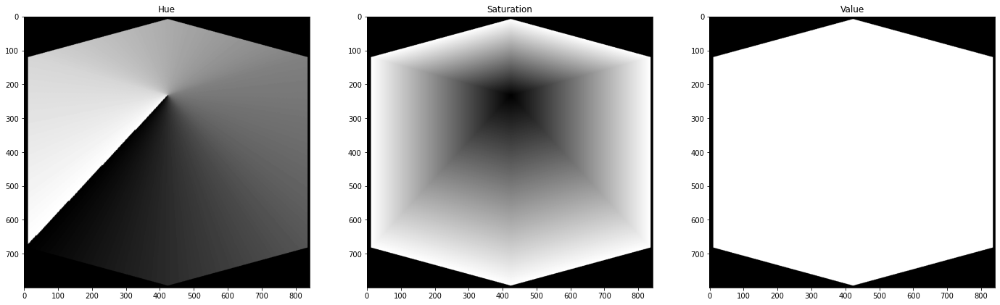

In [ ]:
images = []
images.append(cv.imread('baboon.png'))
images.append(cv.imread('rgb.png'))
images.append(cv.imread('rgbcube_kBKG.png'))

imagesNew = []

# Tranformando o espaco das cores
for img in images:
  imagesNew.append(cv.cvtColor(img, cv.COLOR_BGR2HSV))

# Plotando imagens apos tranformacao
plot3Images(imagesNew[0], imagesNew[1], imagesNew[2])

# Plotando 3 cores conforme as questoes Q1, Q2 e Q3
for img in imagesNew:
  plot3ColorsImagesGrayScale(img, title1='Hue', title2='Saturation', title3='Value')

- HSI.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


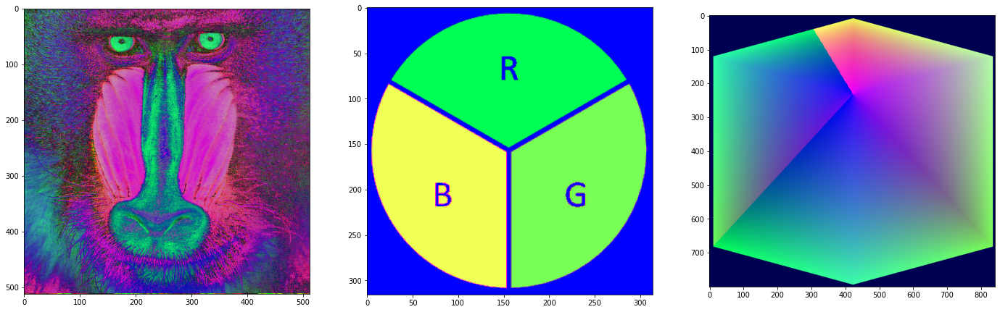

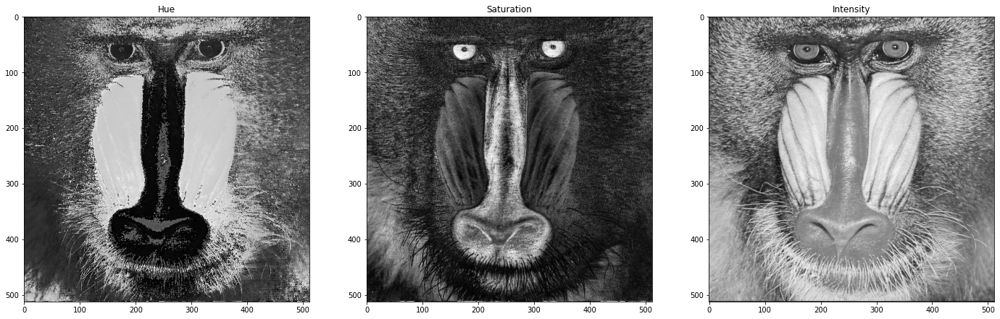

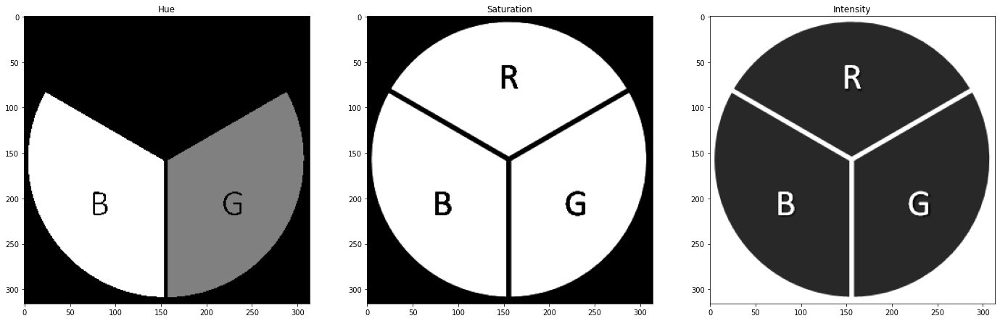

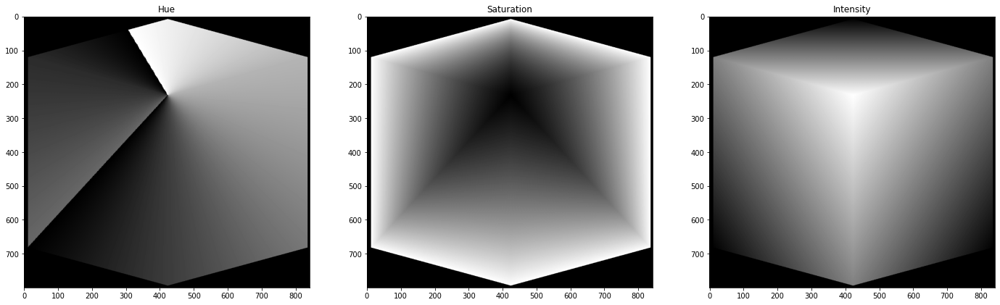

In [ ]:
def convert_bgr_to_HSI(img):
    (B, G, R) = cv.split(img)

    B = B.astype(float)
    G = G.astype(float)
    R = R.astype(float)

    I = np.zeros(B.shape)
    m = np.zeros(B.shape)
    S = np.zeros(B.shape)
    H = np.zeros(B.shape)


    I = (R + G + B)/ 3

    m = np.minimum(np.minimum(R, G), B)
    S = 1 - (3 * m / (R + G + B + 0.001))
    S = S*255

    H = np.where(G >= B, (180/np.pi)*np.arccos((R - 0.5*G - 0.5*B) / np.sqrt(R**2 + G**2 + B**2 - R*G - R*B - G*B)),
                 360 - (180/np.pi)*np.arccos((R - 0.5*G - 0.5*B) / np.sqrt(R**2 + G**2 + B**2 - R*G - R*B - G*B)) )

    H = H.astype(np.uint8)
    S = S.astype(np.uint8)
    I = I.astype(np.uint8)
    return cv.merge((H, S, I))

images = []
images.append(cv.imread('baboon.png'))
images.append(cv.imread('rgb.png'))
images.append(cv.imread('rgbcube_kBKG.png'))

imagesNew = []

# Tranformando o espaco das cores
for img in images:
  imagesNew.append(convert_bgr_to_HSI(img))

# Plotando imagens apos tranformacao
plot3Images(imagesNew[0], imagesNew[1], imagesNew[2])

# Plotando 3 cores conforme as questoes Q1, Q2 e Q3
for img in imagesNew:
  plot3ColorsImagesGrayScale(img, title1='Hue', title2='Saturation', title3='Intensity')

- LAB.

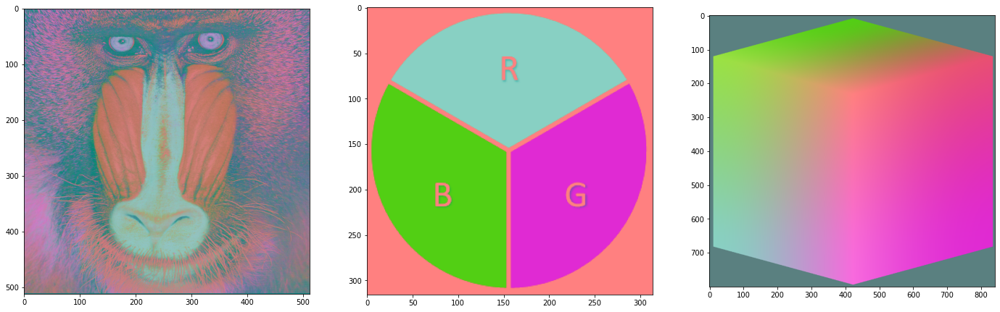

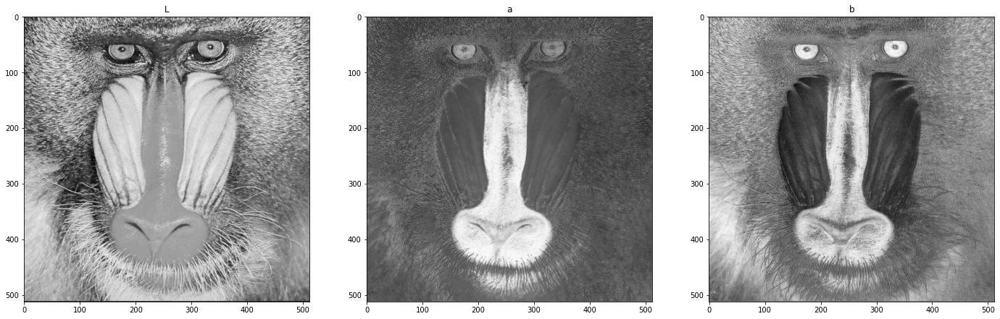

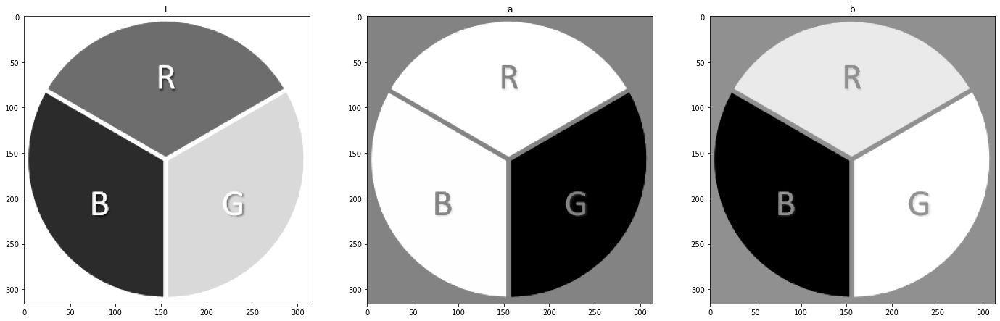

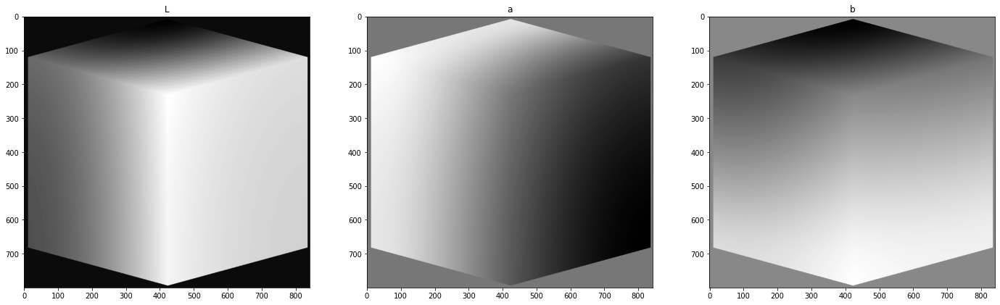

In [ ]:
images = []
images.append(cv.imread('baboon.png'))
images.append(cv.imread('rgb.png'))
images.append(cv.imread('rgbcube_kBKG.png'))

imagesNew = []

# Tranformando o espaco das cores
for img in images:
  imagesNew.append(cv.cvtColor(img, cv.COLOR_BGR2Lab))

# Plotando imagens apos tranformacao
plot3Images(imagesNew[0], imagesNew[1], imagesNew[2])

# Plotando 3 cores conforme as questoes Q1, Q2 e Q3
for img in imagesNew:
  plot3ColorsImagesGrayScale(img, title1='L', title2='a', title3='b')

- CIE XYZ.

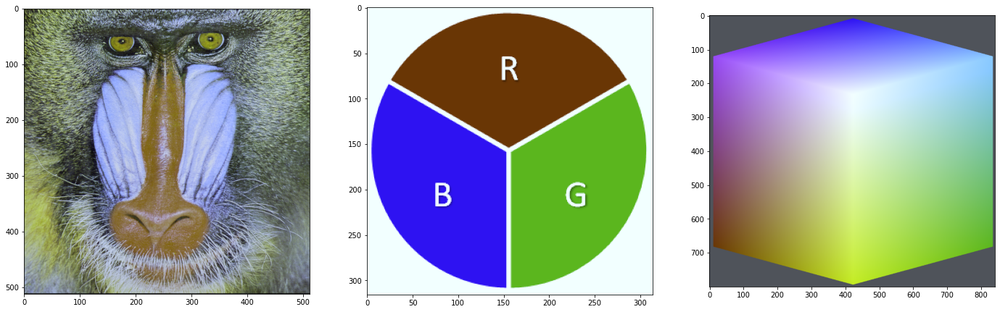

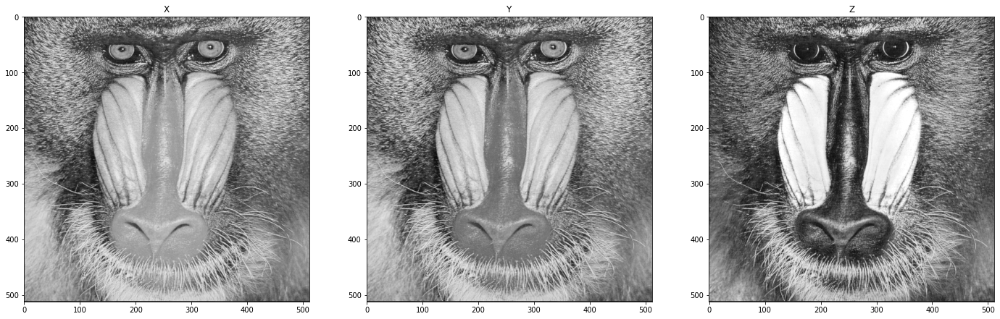

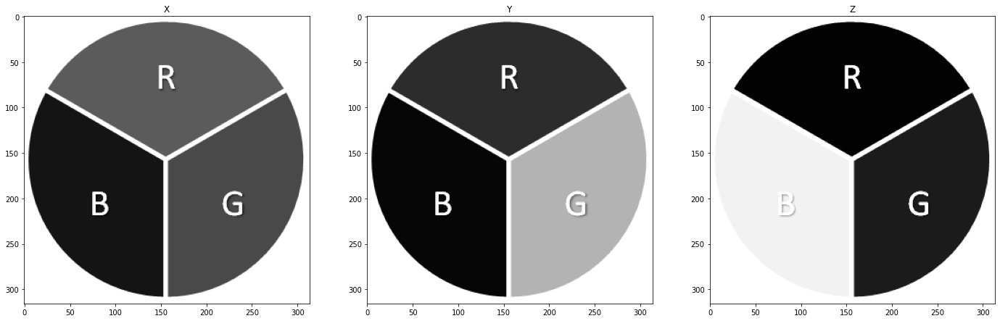

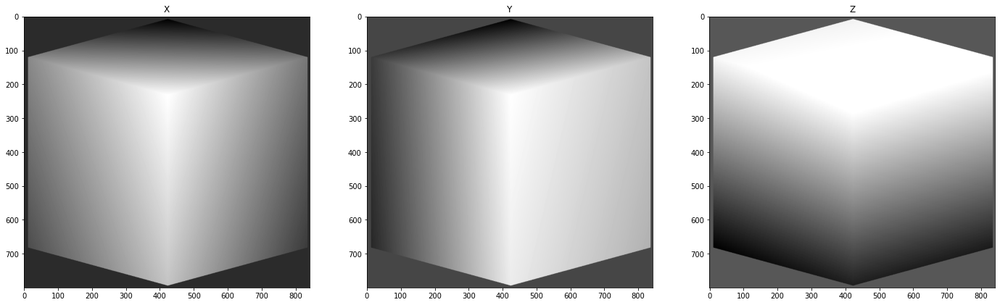

In [ ]:
images = []
images.append(cv.imread('baboon.png'))
images.append(cv.imread('rgb.png'))
images.append(cv.imread('rgbcube_kBKG.png'))

imagesNew = []

# Tranformando o espaco das cores
for img in images:
  imagesNew.append(cv.cvtColor(img, cv.COLOR_BGR2XYZ))

# Plotando imagens apos tranformacao
plot3Images(imagesNew[0], imagesNew[1], imagesNew[2])

# Plotando 3 cores conforme as questoes Q1, Q2 e Q3
for img in imagesNew:
  plot3ColorsImagesGrayScale(img, title1='X', title2='Y', title3='Z')

- CMYK.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


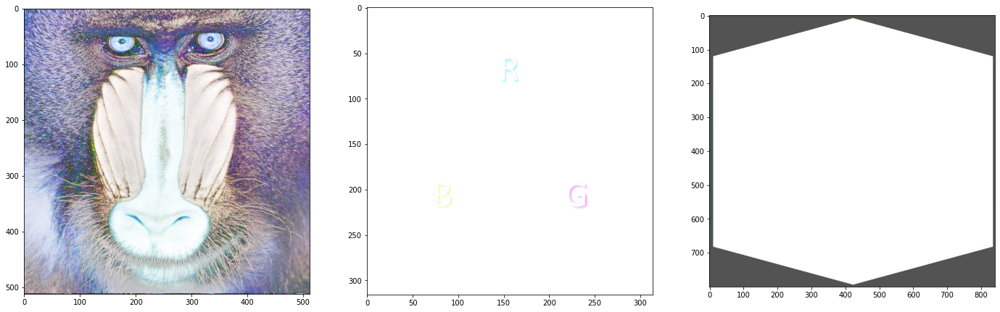

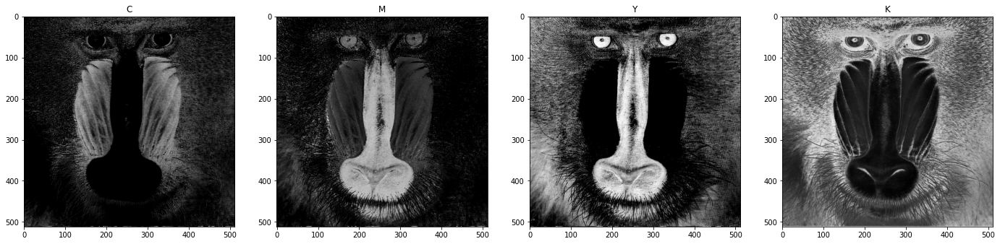

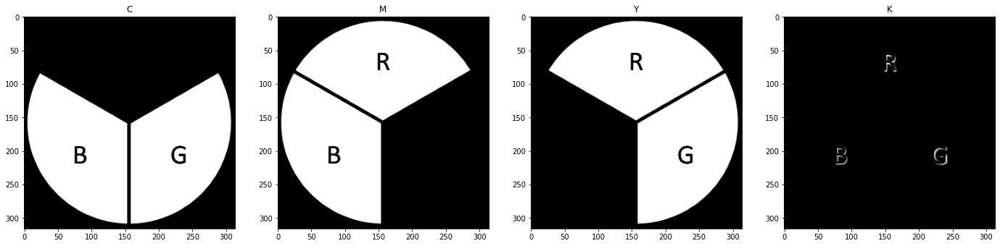

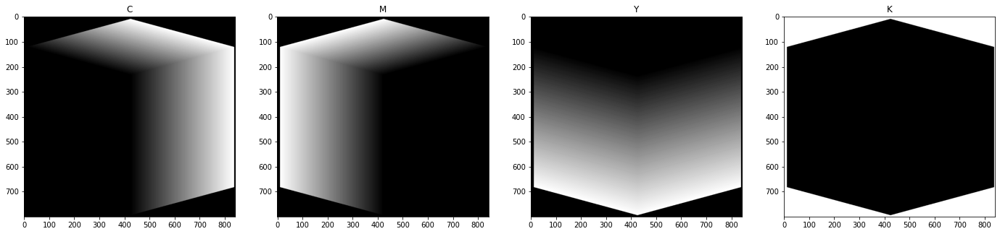

In [ ]:
def convert_bgr_to_CMYK(img):
    imgAux = img.astype(float) / 255.0
    K = 1 - np.max(imgAux, axis=2)
    C = (1-imgAux[:, :, 2] - K) / (1-K)
    M = (1-imgAux[:, :, 1] - K) / (1-K)
    Y = (1-imgAux[:, :, 0] - K) / (1-K)

    return (cv.merge((C, M, Y, K)) * 255).astype(np.uint8)

images = []
images.append(cv.imread('baboon.png'))
images.append(cv.imread('rgb.png'))
images.append(cv.imread('rgbcube_kBKG.png'))

imagesNew = []

# Tranformando o espaco das cores
for img in images:
  imagesNew.append(convert_bgr_to_CMYK(img))

# Plotando imagens apos tranformacao
plot3Images(imagesNew[0], imagesNew[1], imagesNew[2])

# Plotando 3 cores conforme as questoes Q1, Q2 e Q3
for img in imagesNew:
  plot4ColorsImagesGrayScale(img, title1='C', title2='M', title3='Y', title4='K')